## 1. Data Cleaning and Processing

#### Import and Read dataset

In [1]:
# importing the libraries 
import pandas as pd
import numpy as np

In [2]:
df = pd.read_excel('C:\\Users\\annie\\DS\\VScode\\Capstone Project 3\\FAOSTAT_data.xlsx')
df.head()

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description,Note
0,QCL,Crops and livestock products,4,Afghanistan,5312,Area harvested,1371,"Almonds, in shell",2019,2019,ha,29203.0,A,Official figure,NaN
1,QCL,Crops and livestock products,4,Afghanistan,5412,Yield,1371,"Almonds, in shell",2019,2019,kg/ha,1308.3,A,Official figure,NaN
2,QCL,Crops and livestock products,4,Afghanistan,5510,Production,1371,"Almonds, in shell",2019,2019,t,38205.0,A,Official figure,NaN
3,QCL,Crops and livestock products,4,Afghanistan,5312,Area harvested,1371,"Almonds, in shell",2020,2020,ha,22134.0,A,Official figure,NaN
4,QCL,Crops and livestock products,4,Afghanistan,5412,Yield,1371,"Almonds, in shell",2020,2020,kg/ha,1775.9,A,Official figure,NaN


In [3]:
df.shape

(224647, 15)

#### Data Cleaning & Transforming

In [4]:
DataFrame=df.drop(columns=['Domain Code','Area Code (M49)','Item Code (CPC)','Element Code','Year Code','Flag','Flag Description','Note'])

In [5]:
DataFrame.head()

,Domain,Area,Element,Item,Year,Unit,Value
0,Crops and livestock products,Afghanistan,Area harvested,"Almonds, in shell",2019,ha,29203.0
1,Crops and livestock products,Afghanistan,Yield,"Almonds, in shell",2019,kg/ha,1308.3
2,Crops and livestock products,Afghanistan,Production,"Almonds, in shell",2019,t,38205.0
3,Crops and livestock products,Afghanistan,Area harvested,"Almonds, in shell",2020,ha,22134.0
4,Crops and livestock products,Afghanistan,Yield,"Almonds, in shell",2020,kg/ha,1775.9


In [6]:
df_filtered = DataFrame[['Area', 'Item', 'Element', 'Year', 'Unit', 'Value']]

df_pivot = df_filtered.pivot_table(
    index=['Area', 'Item', 'Year'],
    columns='Element',
    values='Value',
    aggfunc='first'
).reset_index()

In [7]:
df_filtered

,Area,Item,Element,Year,Unit,Value
0,Afghanistan,"Almonds, in shell",Area harvested,2019,ha,29203.00
1,Afghanistan,"Almonds, in shell",Yield,2019,kg/ha,1308.30
2,Afghanistan,"Almonds, in shell",Production,2019,t,38205.00
3,Afghanistan,"Almonds, in shell",Area harvested,2020,ha,22134.00
4,Afghanistan,"Almonds, in shell",Yield,2020,kg/ha,1775.90
...,...,...,...,...,...,...
224642,Zimbabwe,"Whole milk, evaporated",Production,2019,t,5010.21
224643,Zimbabwe,"Whole milk, evaporated",Production,2020,t,4795.70
224644,Zimbabwe,"Whole milk, evaporated",Production,2021,t,4921.05
224645,Zimbabwe,"Whole milk, evaporated",Production,2022,t,4966.37


In [8]:
df_pivot.head()

Element,Area,Item,Year,Area harvested,Laying,Milk Animals,Producing Animals/Slaughtered,Production,Stocks,Yield,Yield/Carcass Weight
0,Afghanistan,"Almonds, in shell",2019,29203.0,NaN,NaN,NaN,38205.0,NaN,1308.3,NaN
1,Afghanistan,"Almonds, in shell",2020,22134.0,NaN,NaN,NaN,39307.0,NaN,1775.9,NaN
2,Afghanistan,"Almonds, in shell",2021,36862.0,NaN,NaN,NaN,64256.0,NaN,1743.2,NaN
3,Afghanistan,"Almonds, in shell",2022,36462.0,NaN,NaN,NaN,63515.0,NaN,1742.0,NaN
4,Afghanistan,"Almonds, in shell",2023,37000.0,NaN,NaN,NaN,67000.0,NaN,1810.8,NaN


In [9]:
df_pivot.drop(columns=['Laying','Milk Animals','Producing Animals/Slaughtered','Stocks','Yield/Carcass Weight'], inplace=True)

In [10]:
df_pivot.head()

Element,Area,Item,Year,Area harvested,Production,Yield
0,Afghanistan,"Almonds, in shell",2019,29203.0,38205.0,1308.3
1,Afghanistan,"Almonds, in shell",2020,22134.0,39307.0,1775.9
2,Afghanistan,"Almonds, in shell",2021,36862.0,64256.0,1743.2
3,Afghanistan,"Almonds, in shell",2022,36462.0,63515.0,1742.0
4,Afghanistan,"Almonds, in shell",2023,37000.0,67000.0,1810.8


In [11]:
df_pivot.fillna({
    'Area harvested': df_pivot['Area harvested'].median(),
    'Yield': df_pivot['Yield'].median(),
    'Production': df_pivot['Production'].median()
}, inplace=True)

In [12]:
df_pivot.isna().sum()

Element
Area              0
Item              0
Year              0
Area harvested    0
Production        0
Yield             0
dtype: int64

In [13]:
df_pivot = df_pivot[['Area', 'Item', 'Year', 'Area harvested', 'Yield', 'Production']]
df_pivot = df_pivot[
    (df_pivot['Area harvested'] > 0) &
    (df_pivot['Yield'] > 0) &
    (df_pivot['Production'] > 0)
]

In [14]:
df_pivot.head()

Element,Area,Item,Year,Area harvested,Yield,Production
0,Afghanistan,"Almonds, in shell",2019,29203.0,1308.3,38205.0
1,Afghanistan,"Almonds, in shell",2020,22134.0,1775.9,39307.0
2,Afghanistan,"Almonds, in shell",2021,36862.0,1743.2,64256.0
3,Afghanistan,"Almonds, in shell",2022,36462.0,1742.0,63515.0
4,Afghanistan,"Almonds, in shell",2023,37000.0,1810.8,67000.0


In [15]:
df_final=pd.DataFrame(df_pivot)

In [16]:
df_final.to_csv('Cleaned_CropProduction.csv',index=False)

## 2. Exploratory Data Analysis (EDA)

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.io as pio

In [18]:
df_eda = pd.read_csv('Cleaned_CropProduction.csv')

#### A. Analyze Crop Distribution

Crop Types - Comparison of Least and Most Cultivated Crops

In [19]:
# Get least and most cultivated crops
Least_items = df_eda['Item'].value_counts().nsmallest(10)
Most_items = df_eda['Item'].value_counts().nlargest(10)

# Create 2 rows, 1 column subplot
fig = make_subplots(rows=2, cols=1, subplot_titles=("Least 10 Cultivated Crops", "Most 10 Cultivated Crops"))

# Top plot - Least cultivated crops
fig.add_trace(
    go.Bar(
        x=Least_items.values,
        y=Least_items.index,
        orientation='h',
        marker=dict(color='teal'),
        name='Least Items'
    ),
    row=1, col=1
)

# Bottom plot - Most cultivated crops
fig.add_trace(
    go.Bar(
        x=Most_items.values,
        y=Most_items.index,
        orientation='h',
        marker=dict(color='goldenrod'),
        name='Most Items'
    ),
    row=2, col=1
)

# Update layout
fig.update_layout(
    height=800,
    width=800,
    title_text="Comparison of Least and Most Cultivated Crops",
    showlegend=False,
    template='plotly_white'
)

# Axis labels
fig.update_xaxes(title_text="Count Of Crops", row=1, col=1)
fig.update_xaxes(title_text="Count Of Crops", row=2, col=1)
fig.update_yaxes(title_text="Crop Type", row=1, col=1)
fig.update_yaxes(title_text="Crop Type", row=2, col=1)

fig.show()


Geographical Distribution - High Agricultural Activity

In [20]:
# Get top 10 areas by count
Area = df_eda['Area'].value_counts().nlargest(20)

# Convert to DataFrame for plotting
area_df = Area.reset_index()
area_df.columns = ['Name_of_Area', 'Count_Of_Area_Cultivated']

# Create barplot using Plotly Express
fig = px.bar(
    area_df,
    x='Count_Of_Area_Cultivated',
    y='Name_of_Area',
    orientation='h',
    color='Count_Of_Area_Cultivated',
    color_continuous_scale='magma',
    title='High Agricultural Activity',
    labels={
        'Count_Of_Area_Cultivated': 'Count Of Area Cultivated',
        'Name_of_Area': 'Name Of Area'
    }
)

# Update layout
fig.update_layout(
    height=600,
    width=800,
    template='plotly_white'
)

fig.show()

### B. Temporal Analysis

Yearly Trends - detect trends in Area harvested, Yield, and Production over time

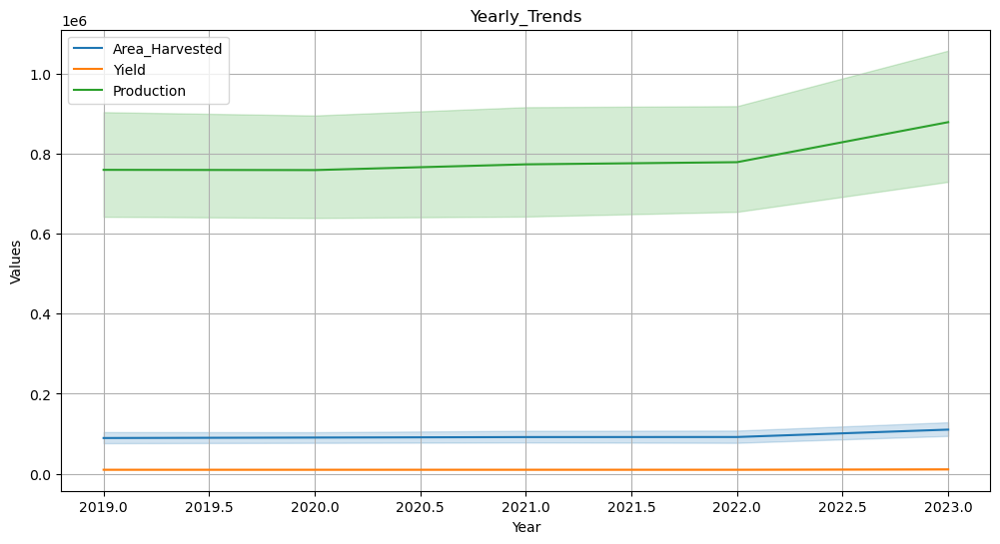

In [21]:
plt.figure(figsize=(12,6))
sns.lineplot(data=df_eda,x='Year',y='Area harvested',label='Area_Harvested')
sns.lineplot(data=df_eda,x='Year',y='Yield',label='Yield')
sns.lineplot(data=df_eda,x='Year',y='Production',label='Production')
plt.title('Yearly_Trends')
plt.xlabel('Year')
plt.ylabel('Values')
plt.grid()
plt.show()

Growth Analysis - Increasing Trends in Yield and Production

In [22]:
# Group and get top 10 by Production
Production = df_eda.groupby('Area')['Production'].sum().nlargest(10).reset_index()

# Create Plot for Production
fig_prod = go.Figure()

fig_prod.add_trace(go.Scatter(
    x=Production['Area'],
    y=Production['Production'],
    mode='lines+markers',
    line=dict(dash='dash', color='green'),
    marker=dict(symbol='x', size=8),
    name='Production'
))

fig_prod.update_layout(
    title='Top 10 Regions With Highest Production',
    xaxis_title='Region',
    yaxis_title='Total Production',
    template='plotly_white',
    height=500,
    width=900
)

fig_prod.update_xaxes(tickangle=45)
fig_prod.show()

# Group and get top 10 by Yield
Yield = df_eda.groupby('Area')['Yield'].sum().nlargest(10).reset_index()

# Create Plot for Yield
fig_yield = go.Figure()

fig_yield.add_trace(go.Scatter(
    x=Yield['Area'],
    y=Yield['Yield'],
    mode='lines+markers',
    line=dict(dash='dash', color='orange'),
    marker=dict(symbol='square', size=8),
    name='Yield'
))

fig_yield.update_layout(
    title='Top 10 Regions With Highest Yield',
    xaxis_title='Region',
    yaxis_title='Total Yield',
    template='plotly_white',
    height=500,
    width=900
)

fig_yield.update_xaxes(tickangle=45)
fig_yield.show()


### C. Environmental Relationships

In [23]:
fig = px.scatter(
    df_eda,
    x="Area harvested",
    y="Yield",
    title="Relationship between Area Harvested and Yield",
    opacity=0.5,
    labels={
        "Area harvested": "Area Harvested (ha)",
        "Yield": "Yield (kg/ha)"
    },
    log_x=True,
    log_y=True
)

fig.update_layout(
    template="plotly_white",
    height=500,
    width=800
)

fig.show()


import plotly.figure_factory as ff

# Calculate correlation coefficients
crop_groups = df_eda.groupby("Item")[["Area harvested", "Yield"]].corr().unstack().iloc[:, 1]

# Create histogram with KDE
fig2 = ff.create_distplot(
    [crop_groups.dropna()],          # Drop NaNs for clean plot
    group_labels=["Correlation Coefficients"],
    bin_size=0.05,
    show_rug=False
)

fig2.update_layout(
    title="Distribution of Correlation Between Area Harvested and Yield Across Crops",
    xaxis_title="Correlation Coefficient (Area Harvested vs. Yield)",
    yaxis_title="Count of Crops",
    template="plotly_white",
    height=500,
    width=900
)

fig2.show()


### D. Input-Output Relationships

In [24]:
# Compute correlation matrix
cor_mar = df_eda[['Area harvested', 'Yield', 'Production']].corr().round(2)

# Create heatmap
fig = go.Figure(data=go.Heatmap(
    z=cor_mar.values,
    x=cor_mar.columns,
    y=cor_mar.index,
    colorscale='RdBu',
    zmin=-1,
    zmax=1,
    colorbar=dict(title="Correlation"),
    text=cor_mar.values,
    texttemplate="%{text:.2f}",  # show correlation values on cells
    hovertemplate="Correlation between %{x} and %{y}: %{z:.2f}<extra></extra>"
))

# Update layout
fig.update_layout(
    title='Correlation B/W Area Harvested, Yield, And Production',
    width=700,
    height=500,
    template='plotly_white'
)

fig.show()


### E. Comparative_Analysis

Across Crops

In [25]:
# Calculate average yield per crop
crop_yield = df_eda.groupby("Item")["Yield"].mean().sort_values(ascending=False)

# Create subplot figure with 2 rows and 1 column
fig = make_subplots(
    rows=2, cols=1,
    subplot_titles=("Top 10 High-Yield Crops", "Top 10 Low-Yield Crops"),
    shared_yaxes=False
)

# Top 10 high-yield crops
fig.add_trace(go.Bar(
    x=crop_yield.values[:10],
    y=crop_yield.index[:10],
    orientation='h',
    marker=dict(color=crop_yield.values[:10], colorscale='Greens'),
    name='High Yield'
), row=1, col=1)

# Bottom 10 low-yield crops
fig.add_trace(go.Bar(
    x=crop_yield.values[-10:],
    y=crop_yield.index[-10:],
    orientation='h',
    marker=dict(color=crop_yield.values[-10:], colorscale='Reds'),
    name='Low Yield'
), row=2, col=1)

# Update layout
fig.update_layout(
    height=500,
    width=1000,
    title_text="Top 10 High-Yield and Low-Yield Crops",
    template="plotly_white",
    showlegend=False
)

# Flip y-axes for better readability
fig.update_yaxes(autorange="reversed", row=1, col=1)
fig.update_yaxes(autorange="reversed", row=1, col=2)

fig.show()


Across Regions

In [26]:
# Group by Area and calculate average Production
region_production = df_eda.groupby('Area')['Production'].mean().sort_values(ascending=False)

# Select Top 10 regions
top_10_regions = region_production.head(10).reset_index()

# Create Plotly horizontal bar chart
fig = px.bar(
    top_10_regions,
    x='Production',
    y='Area',
    orientation='h',
    color='Production',
    color_continuous_scale='viridis',
    title="Top 10 Highly Productive Regions",
    labels={'Production': 'Average Production', 'Area': 'Region'}
)

fig.update_layout(
    height=500,
    width=800,
    template='plotly_white',
    yaxis=dict(autorange='reversed')  # Show top region at the top
)

fig.show()


### F. Productivity Analysis

Top 10 High-Yield Crops

In [27]:
crop = df_eda.groupby('Item')['Yield'].mean().sort_values(ascending=False).head(10).reset_index()

fig1 = go.Figure(
    data=go.Bar(
        x=crop['Item'],
        y=crop['Yield'],
        marker=dict(
            color=crop['Yield'],
            colorscale='viridis',
            colorbar=dict(title='Average Yield')
        )
    )
)

fig1.update_layout(
    title="Top 10 High-Yield Crops",
    xaxis_title='Crop',
    yaxis_title='Average Yield',
    xaxis_tickangle=90,
    template='plotly_white'
)
fig1.show()

Top 10 High-Yield Regions

In [28]:
region = df_eda.groupby('Area')['Yield'].mean().sort_values(ascending=False).head(10).reset_index()

fig2 = px.bar(
    region,
    x='Area',
    y='Yield',
    title="Top 10 High-Yield Regions",
    labels={'Area': 'Region', 'Yield': 'Average Yield'},
    color='Yield',
    color_continuous_scale='viridis'
)

fig2.update_layout(xaxis_tickangle=90, template='plotly_white')
fig2.show()


Productivity Ratio Distribution

In [29]:
df_eda['Productivity Ratio'] = df_eda['Production'] / df_eda['Area harvested']

fig3 = px.histogram(
    df_eda,
    x='Productivity Ratio',
    nbins=30,
    marginal='violin',  # optional: adds a KDE-style violin plot
    title='Distribution of Productivity Ratio',
    labels={'Productivity Ratio': 'Productivity Ratio'},
    color_discrete_sequence=['indigo']
)

fig3.update_layout(
    template='plotly_white',
    xaxis_title='Productivity Ratio',
    yaxis_title='Count',
    bargap=0.1
)

fig3.show()


### G. Outliers and Anomalies

In [30]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

columns_to_check = ['Area harvested', 'Yield', 'Production']

# Create 1-row, 3-column subplot layout
fig = make_subplots(
    rows=1, cols=3,
    subplot_titles=[f"Boxplot of {col}" for col in columns_to_check]
)

# Add boxplots to each subplot
for i, col in enumerate(columns_to_check):
    fig.add_trace(
        go.Box(y=df_eda[col], name=col, marker_color='royalblue'),
        row=1, col=i + 1
    )

# Update layout
fig.update_layout(
    height=400,
    width=1000,
    title_text="Boxplots of Area Harvested, Yield, and Production",
    template="plotly_white",
    showlegend=False
)

fig.show()


## 3. Model

In [33]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

In [34]:
# **Apply Label Encoding for High-Cardinality Categorical Features**
label_encoders = {}
for col in ["Area", "Item"]:  # Encoding categorical variables
    label_encoders[col] = LabelEncoder()
    df_pivot[col] = label_encoders[col].fit_transform(df_pivot[col])

In [35]:
# Define Features (X) and Target Variable (y)
X = df_pivot.drop(columns=["Production"])  # Features (exclude target)
y = df_pivot["Production"]  # Target variable (Crop Production in Tons)

In [36]:
# Splitting the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

### Linear Regression

In [37]:
# Train Linear Regression model
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [38]:
# Predictions
y_pred = model.predict(X_test)

In [39]:
# Model Evaluation
print("R² Score:", r2_score(y_test, y_pred))
print("MAE:", mean_absolute_error(y_test, y_pred))
print("MSE:", mean_squared_error(y_test, y_pred))

R² Score: 0.5637994718141174
MAE: 850583.3705240722
MSE: 28696105922231.15


### Lasso Regression

In [40]:
from sklearn.linear_model import Lasso

In [41]:
# Initialize Lasso Regression model
lasso_model = Lasso(alpha=0.1)  # Alpha controls regularization strength

In [42]:
# Train the model
lasso_model.fit(X_train, y_train)

Lasso(alpha=0.1)

In [43]:
# Predictions
y_pred_lasso = lasso_model.predict(X_test)

In [44]:
# Evaluate performance
print("Lasso Regression R² Score:", r2_score(y_test, y_pred_lasso))
print("Lasso Regression MAE:", mean_absolute_error(y_test, y_pred_lasso))
print("Lasso Regression MSE:", mean_squared_error(y_test, y_pred_lasso))

Lasso Regression R² Score: 0.5637994718657668
Lasso Regression MAE: 850583.3690143416
Lasso Regression MSE: 28696105918833.316


### Rigde Regression

In [45]:
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

In [46]:
# Initialize Ridge Regression model
ridge_model = Ridge(alpha=1.0)  # Alpha controls regularization strength

In [47]:
# Train the model
ridge_model.fit(X_train, y_train)

Ridge()

In [48]:
# Predictions
y_pred_ridge = ridge_model.predict(X_test)

In [49]:
# Evaluate performance
print("Ridge Regression R² Score:", r2_score(y_test, y_pred_ridge))
print("Ridge Regression MAE:", mean_absolute_error(y_test, y_pred_ridge))
print("Ridge Regression MSE:", mean_squared_error(y_test, y_pred_ridge))

Ridge Regression R² Score: 0.5637994718229726
Ridge Regression MAE: 850583.3699760529
Ridge Regression MSE: 28696105921648.59


### Random Forest Regression

In [50]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

In [51]:
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [52]:
# Predictions
y_pred = model.predict(X_test)

In [53]:
# Model Evaluation
print("R² Score:", r2_score(y_test, y_pred))
print("MAE:", mean_absolute_error(y_test, y_pred))
print("MSE:", mean_squared_error(y_test, y_pred))

R² Score: 0.9763311414539283
MAE: 88480.96470676445
MSE: 1557091355943.851


In [54]:
import joblib
# Save Model & Features for Streamlit App
joblib.dump(model, "crop_production_rf_model.pkl")
joblib.dump(list(X.columns), "model_features.pkl")

['model_features.pkl']